In [3]:
# @title One-time library installation (heavy operations)
# YOLO Object Detection and Comparison - Google Colab Notebook
# Run cells in order. Heavy installations are in separate cells to avoid re-running.

# ============================================================================
# CELL 1: Install Required Libraries (Run once)
# ============================================================================

!pip install ultralytics opencv-python-headless pillow numpy matplotlib
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.6 MB/s eta 0:00:00
Looking in indexes: https://download.pytorch.org/whl/cu118


In [4]:
# @title Import libraries
# ============================================================================
# CELL 2: Import Libraries (Run once after installation)
# ============================================================================
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from ultralytics import YOLO
from collections import Counter
import tempfile
import os
from google.colab import files
import io

print("✅ All libraries imported successfully!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ All libraries imported successfully!


In [5]:
# @title Model initialization (loads YOLOv11x - largest model for maximum detection)
# ============================================================================
# CELL 3: Initialize YOLO Model (Run once - model loading)
# ============================================================================
# Using YOLOv11x for maximum detection capability
MODEL_NAME = "yolo11x.pt"  # Largest model for best detection
model = YOLO(MODEL_NAME)

print(f"✅ YOLO model {MODEL_NAME} loaded successfully!")
print("Model classes:", len(model.names), "classes available")

✅ YOLO model yolo11x.pt loaded successfully!
Model classes: 80 classes available


In [6]:
# @title Detection and analysis functions
# ============================================================================
# CELL 4: Detection and Analysis Functions (Run once)
# ============================================================================
def detect_objects(image, conf_threshold=0.15, iou_threshold=0.45, max_detection=500):
    """
    Enhanced object detection with maximum sensitivity
    """
    # Convert PIL to numpy if needed
    if isinstance(image, Image.Image):
        image_array = np.array(image)
    else:
        image_array = image

    # Run inference with optimized parameters for maximum detection
    results = model.predict(
        source=image_array,
        conf=conf_threshold,  # Lower confidence for more detections
        iou=iou_threshold,
        imgsz=640,
        max_det=max_detection,  # Higher max detections
        show_labels=True,
        show_conf=True,
        agnostic_nms=True,  # More comprehensive NMS
        verbose=False
    )

    return results

def analyze_detections(results):
    """
    Analyze detection results and create detailed report
    """
    detections = []
    class_counts = Counter()

    for r in results:
        boxes = r.boxes
        if boxes is not None:
            for i, box in enumerate(boxes):
                # Get class name and confidence
                class_id = int(box.cls.cpu().numpy()[0])
                class_name = model.names[class_id]
                confidence = float(box.conf.cpu().numpy()[0])

                # Get bounding box coordinates
                x1, y1, x2, y2 = box.xyxy.cpu().numpy()[0]

                detection_info = {
                    'class_name': class_name,
                    'confidence': confidence,
                    'bbox': (x1, y1, x2, y2),
                    'area': (x2-x1) * (y2-y1)
                }
                detections.append(detection_info)
                class_counts[class_name] += 1

    return detections, class_counts

def create_detection_report(detections, class_counts, image_name):
    """
    Create a detailed detection report
    """
    report = f"\n📊 DETECTION REPORT FOR {image_name.upper()}\n"
    report += "=" * 50 + "\n"

    report += f"Total Objects Detected: {len(detections)}\n"
    report += f"Unique Classes: {len(class_counts)}\n\n"

    report += "📋 OBJECT COUNT BY CLASS:\n"
    report += "-" * 30 + "\n"
    for class_name, count in class_counts.most_common():
        report += f"{class_name}: {count}\n"

    report += f"\n🔍 DETAILED DETECTIONS:\n"
    report += "-" * 30 + "\n"
    for i, det in enumerate(detections, 1):
        report += f"{i:2d}. {det['class_name']} (confidence: {det['confidence']:.2f})\n"

    return report

def compare_images(detections1, class_counts1, detections2, class_counts2):
    """
    Compare two sets of detections
    """
    comparison = "\n🔄 COMPARISON BETWEEN IMAGE 1 AND IMAGE 2\n"
    comparison += "=" * 55 + "\n"

    # Object count comparison
    total1 = len(detections1)
    total2 = len(detections2)
    comparison += f"Total objects - Image 1: {total1}, Image 2: {total2}\n"
    comparison += f"Change in total objects: {total2 - total1:+d}\n\n"

    # Class-wise comparison
    all_classes = set(class_counts1.keys()) | set(class_counts2.keys())
    comparison += "📊 CLASS-WISE CHANGES:\n"
    comparison += "-" * 25 + "\n"

    for class_name in sorted(all_classes):
        count1 = class_counts1.get(class_name, 0)
        count2 = class_counts2.get(class_name, 0)
        change = count2 - count1

        if change != 0:
            comparison += f"{class_name}: {count1} → {count2} ({change:+d})\n"
        else:
            comparison += f"{class_name}: {count1} (no change)\n"

    # New and removed classes
    new_classes = set(class_counts2.keys()) - set(class_counts1.keys())
    removed_classes = set(class_counts1.keys()) - set(class_counts2.keys())

    if new_classes:
        comparison += f"\n✅ NEW OBJECTS DETECTED: {', '.join(new_classes)}\n"
    if removed_classes:
        comparison += f"❌ OBJECTS NO LONGER DETECTED: {', '.join(removed_classes)}\n"

    return comparison

def display_results(image, results, title):
    """
    Display original and annotated images side by side
    """
    # Get annotated image
    annotated_image = None
    for r in results:
        annotated_array = r.plot()
        annotated_image = Image.fromarray(annotated_array[..., ::-1])

    # Create side-by-side display
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(image)
    axes[0].set_title(f'Original {title}', fontsize=16, fontweight='bold')
    axes[0].axis('off')

    if annotated_image:
        axes[1].imshow(annotated_image)
        axes[1].set_title(f'Detected Objects - {title}', fontsize=16, fontweight='bold')
        axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    return annotated_image

print("✅ All detection and analysis functions ready!")

✅ All detection and analysis functions ready!


📤 Please upload your FIRST image:


Saving var5.png to var5 (1).png
✅ First image loaded: var5 (1).png
Image size: (1024, 1536)
🔍 Detecting objects in first image...


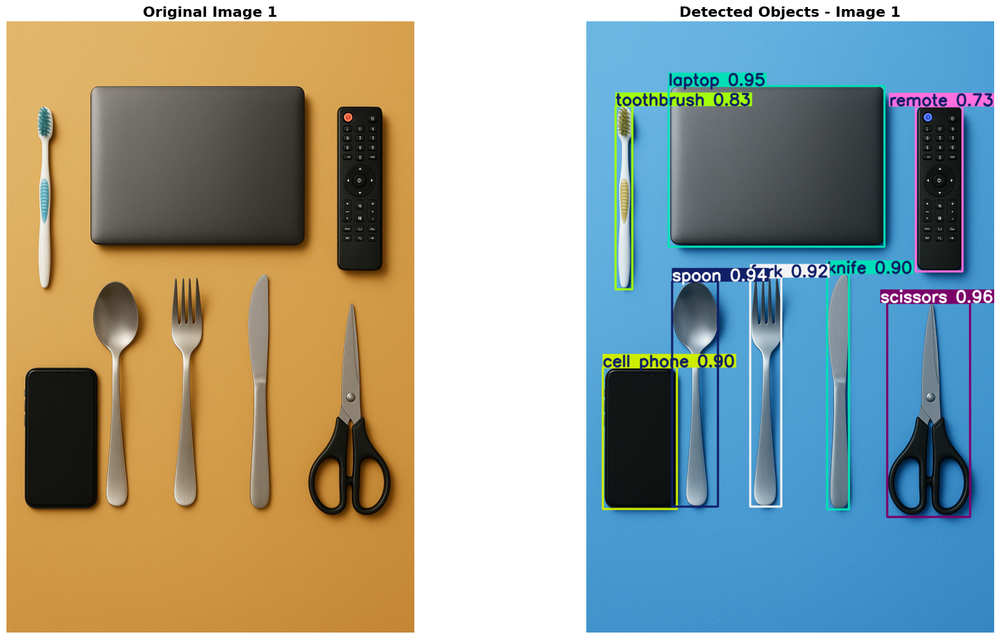


📊 DETECTION REPORT FOR IMAGE 1
Total Objects Detected: 8
Unique Classes: 8

📋 OBJECT COUNT BY CLASS:
------------------------------
scissors: 1
laptop: 1
spoon: 1
fork: 1
knife: 1
cell phone: 1
toothbrush: 1
remote: 1

🔍 DETAILED DETECTIONS:
------------------------------
 1. scissors (confidence: 0.96)
 2. laptop (confidence: 0.95)
 3. spoon (confidence: 0.94)
 4. fork (confidence: 0.92)
 5. knife (confidence: 0.90)
 6. cell phone (confidence: 0.90)
 7. toothbrush (confidence: 0.83)
 8. remote (confidence: 0.73)



In [18]:
# @title First image upload and processing
# ============================================================================
# CELL 5: Upload and Process First Image
# ============================================================================
print("📤 Please upload your FIRST image:")
uploaded_files = files.upload()

# Process first uploaded file
first_image_path = list(uploaded_files.keys())[0]
image1 = Image.open(io.BytesIO(uploaded_files[first_image_path]))

print(f"✅ First image loaded: {first_image_path}")
print(f"Image size: {image1.size}")

# Detect objects in first image
print("🔍 Detecting objects in first image...")
results1 = detect_objects(image1, conf_threshold=0.15, max_detection=500)
detections1, class_counts1 = analyze_detections(results1)

# Display results
annotated_image1 = display_results(image1, results1, "Image 1")

# Generate and print report
report1 = create_detection_report(detections1, class_counts1, "Image 1")
print(report1)

📤 Please upload your SECOND image:


Saving var6.png to var6 (1).png
✅ Second image loaded: var6 (1).png
Image size: (1024, 1536)
🔍 Detecting objects in second image...


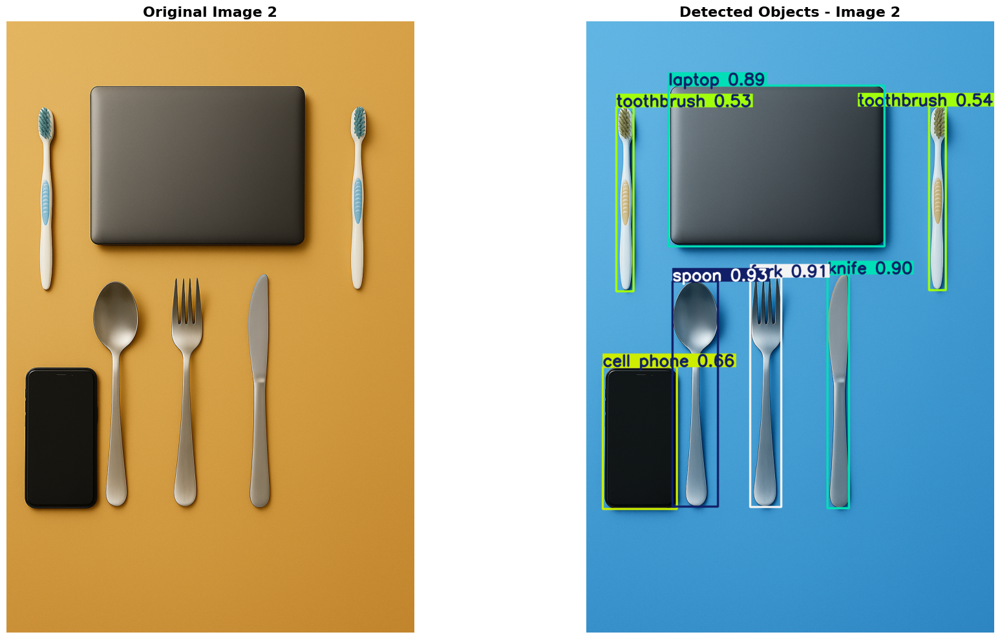


📊 DETECTION REPORT FOR IMAGE 2
Total Objects Detected: 7
Unique Classes: 6

📋 OBJECT COUNT BY CLASS:
------------------------------
toothbrush: 2
spoon: 1
fork: 1
knife: 1
laptop: 1
cell phone: 1

🔍 DETAILED DETECTIONS:
------------------------------
 1. spoon (confidence: 0.93)
 2. fork (confidence: 0.91)
 3. knife (confidence: 0.90)
 4. laptop (confidence: 0.89)
 5. cell phone (confidence: 0.66)
 6. toothbrush (confidence: 0.54)
 7. toothbrush (confidence: 0.53)



In [19]:
# @title Second image upload and processing
# ============================================================================
# CELL 6: Upload and Process Second Image
# ============================================================================
print("📤 Please upload your SECOND image:")
uploaded_files2 = files.upload()

# Process second uploaded file
second_image_path = list(uploaded_files2.keys())[0]
image2 = Image.open(io.BytesIO(uploaded_files2[second_image_path]))

print(f"✅ Second image loaded: {second_image_path}")
print(f"Image size: {image2.size}")

# Detect objects in second image
print("🔍 Detecting objects in second image...")
results2 = detect_objects(image2, conf_threshold=0.15, max_detection=500)
detections2, class_counts2 = analyze_detections(results2)

# Display results
annotated_image2 = display_results(image2, results2, "Image 2")

# Generate and print report
report2 = create_detection_report(detections2, class_counts2, "Image 2")
print(report2)


🔄 COMPARISON BETWEEN IMAGE 1 AND IMAGE 2
Total objects - Image 1: 8, Image 2: 7
Change in total objects: -1

📊 CLASS-WISE CHANGES:
-------------------------
cell phone: 1 (no change)
fork: 1 (no change)
knife: 1 (no change)
laptop: 1 (no change)
remote: 1 → 0 (-1)
scissors: 1 → 0 (-1)
spoon: 1 (no change)
toothbrush: 1 → 2 (+1)
❌ OBJECTS NO LONGER DETECTED: remote, scissors



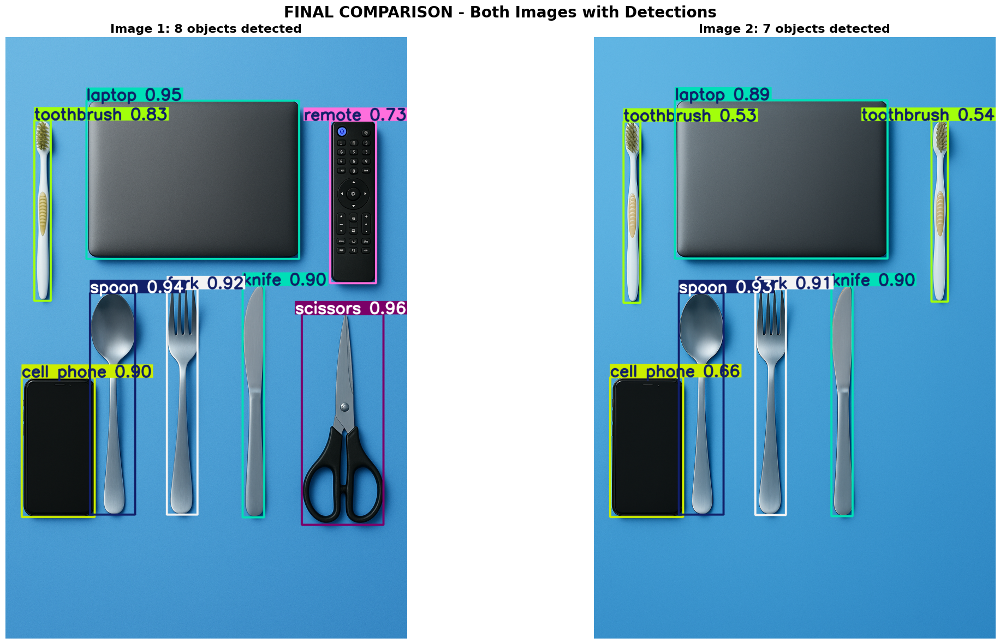

✅ Analysis complete!


In [20]:
# @title Detailed comparison between both images
# ============================================================================
# CELL 7: Compare Both Images
# ============================================================================
# Generate comparison report
comparison_report = compare_images(detections1, class_counts1, detections2, class_counts2)
print(comparison_report)

# Display both annotated images side by side for final comparison
fig, axes = plt.subplots(1, 2, figsize=(24, 12))

axes[0].imshow(annotated_image1)
axes[0].set_title(f'Image 1: {len(detections1)} objects detected', fontsize=16, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(annotated_image2)
axes[1].set_title(f'Image 2: {len(detections2)} objects detected', fontsize=16, fontweight='bold')
axes[1].axis('off')

plt.suptitle('FINAL COMPARISON - Both Images with Detections', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

print("✅ Analysis complete!")

🔧 ADJUSTING DETECTION PARAMETERS...
Re-analyzing Image 1 with new parameters...


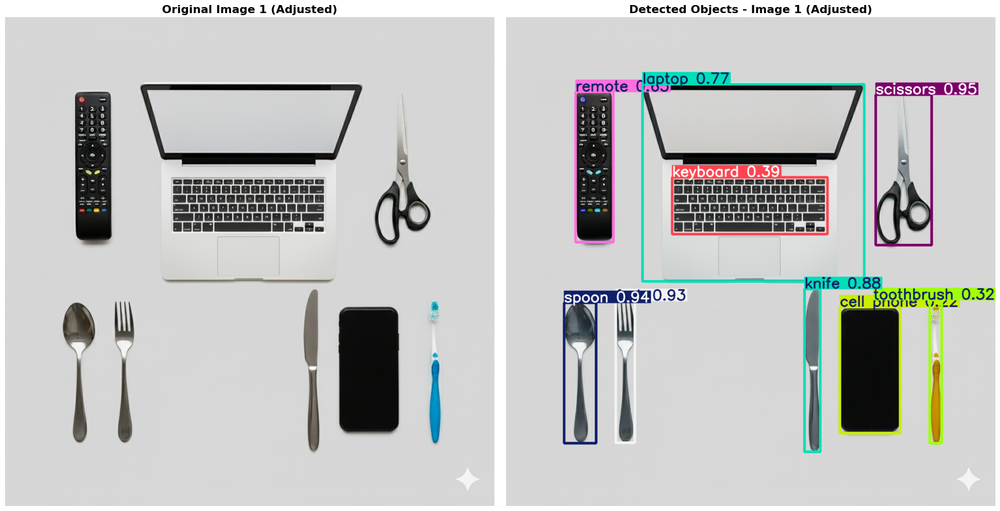


📊 DETECTION REPORT FOR IMAGE 1 (ADJUSTED)
Total Objects Detected: 9
Unique Classes: 9

📋 OBJECT COUNT BY CLASS:
------------------------------
scissors: 1
spoon: 1
fork: 1
knife: 1
laptop: 1
remote: 1
keyboard: 1
toothbrush: 1
cell phone: 1

🔍 DETAILED DETECTIONS:
------------------------------
 1. scissors (confidence: 0.95)
 2. spoon (confidence: 0.94)
 3. fork (confidence: 0.93)
 4. knife (confidence: 0.88)
 5. laptop (confidence: 0.77)
 6. remote (confidence: 0.65)
 7. keyboard (confidence: 0.39)
 8. toothbrush (confidence: 0.32)
 9. cell phone (confidence: 0.22)

Re-analyzing Image 2 with new parameters...


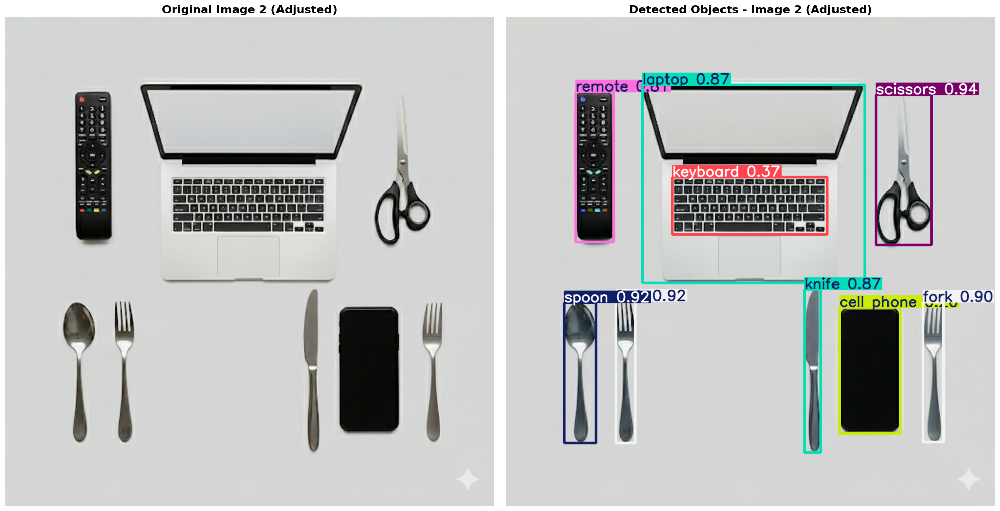


📊 DETECTION REPORT FOR IMAGE 2 (ADJUSTED)
Total Objects Detected: 9
Unique Classes: 8

📋 OBJECT COUNT BY CLASS:
------------------------------
fork: 2
scissors: 1
spoon: 1
knife: 1
laptop: 1
remote: 1
keyboard: 1
cell phone: 1

🔍 DETAILED DETECTIONS:
------------------------------
 1. scissors (confidence: 0.94)
 2. spoon (confidence: 0.92)
 3. fork (confidence: 0.92)
 4. fork (confidence: 0.90)
 5. knife (confidence: 0.87)
 6. laptop (confidence: 0.87)
 7. remote (confidence: 0.81)
 8. keyboard (confidence: 0.37)
 9. cell phone (confidence: 0.20)


🔄 COMPARISON BETWEEN IMAGE 1 AND IMAGE 2
Total objects - Image 1: 9, Image 2: 9
Change in total objects: +0

📊 CLASS-WISE CHANGES:
-------------------------
cell phone: 1 (no change)
fork: 1 → 2 (+1)
keyboard: 1 (no change)
knife: 1 (no change)
laptop: 1 (no change)
remote: 1 (no change)
scissors: 1 (no change)
spoon: 1 (no change)
toothbrush: 1 → 0 (-1)
❌ OBJECTS NO LONGER DETECTED: toothbrush



In [16]:
# @title Parameter adjustment (for even more detections)
# ============================================================================
# CELL 8: Optional - Adjust Detection Parameters and Re-analyze
# ============================================================================
print("🔧 ADJUSTING DETECTION PARAMETERS...")

# You can modify these parameters:
NEW_CONF_THRESHOLD = 0.1   # Lower = more detections (but potentially more false positives)
NEW_IOU_THRESHOLD = 0.3    # Lower = less overlap filtering
NEW_MAX_DETECTION = 1000   # Higher = more potential detections

# Re-analyze first image with new parameters
print("Re-analyzing Image 1 with new parameters...")
results1_new = detect_objects(image1, NEW_CONF_THRESHOLD, NEW_IOU_THRESHOLD, NEW_MAX_DETECTION)
detections1_new, class_counts1_new = analyze_detections(results1_new)
display_results(image1, results1_new, "Image 1 (Adjusted)")
print(create_detection_report(detections1_new, class_counts1_new, "Image 1 (Adjusted)"))

# Re-analyze second image with new parameters
print("Re-analyzing Image 2 with new parameters...")
results2_new = detect_objects(image2, NEW_CONF_THRESHOLD, NEW_IOU_THRESHOLD, NEW_MAX_DETECTION)
detections2_new, class_counts2_new = analyze_detections(results2_new)
display_results(image2, results2_new, "Image 2 (Adjusted)")
print(create_detection_report(detections2_new, class_counts2_new, "Image 2 (Adjusted)"))

# Compare adjusted results
print(compare_images(detections1_new, class_counts1_new, detections2_new, class_counts2_new))

In [17]:
# @title Results saving
# ============================================================================
# CELL 9: Save Results (Optional)
# ============================================================================
if annotated_image1:
    annotated_image1.save('image1_detected.jpg')
    print("✅ Image 1 results saved as 'image1_detected.jpg'")

if annotated_image2:
    annotated_image2.save('image2_detected.jpg')
    print("✅ Image 2 results saved as 'image2_detected.jpg'")

# Save reports to text file
with open('detection_reports.txt', 'w') as f:
    f.write(report1)
    f.write('\n' + '='*80 + '\n')
    f.write(report2)
    f.write('\n' + '='*80 + '\n')
    f.write(comparison_report)

print("✅ Reports saved to 'detection_reports.txt'")

# Download files
files.download('detection_reports.txt')
if annotated_image1:
    files.download('image1_detected.jpg')
if annotated_image2:
    files.download('image2_detected.jpg')

✅ Image 1 results saved as 'image1_detected.jpg'
✅ Image 2 results saved as 'image2_detected.jpg'
✅ Reports saved to 'detection_reports.txt'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>